In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import albumentations as A
from tqdm import tqdm
import pandas as pd
import shutil
import glob
import tensorflow as tf

In [2]:



# Configuration
IMAGE_SIZE = 512
BATCH_SIZE = 8
NUM_CLASSES = 5
RANDOM_STATE = 42

In [3]:
# hafm tawng cuong anh
def get_augmentations():
    return A.Compose([
        A.Rotate(limit=15, p=1), #xoay
        #A.Affine(shear=(1, 3), p=0.5),# xien meo
        A.HorizontalFlip(p=0.5),# lap
        A.VerticalFlip(p=0.5),
       A.RandomResizedCrop(height=IMAGE_SIZE, width=IMAGE_SIZE, scale=(0.9, 0.95), size=(IMAGE_SIZE, IMAGE_SIZE), p=0.7),# cat trong khoang random
        A.ShiftScaleRotate(shift_limit=0.02, scale_limit=0.1, rotate_limit=0, p=0.7),# dich chuyen 2% chieu rong ,cao . thay doi kich thuoc 10%
        A.HueSaturationValue(hue_shift_limit=10, sat_shift_limit=20, val_shift_limit=10, p=0.7),#  Krizhevsky color augmentation: thay đổi tông màu sắc
        A.OpticalDistortion(distort_limit=0.2, shift_limit=0.2, p=0.5),# lam bien dang 
        A.Affine(translate_px=(-10, 10), p=0.5)# tinh tien theo truc  xy 
    ])

In [4]:
# hafm tawng cuong anh
def get_augmentations_for_large():
    return A.Compose([
        A.Rotate(limit=15, p=1), #xoay
        A.Affine(shear=(1, 3), p=0.5),# xien meo
        A.HorizontalFlip(p=0.5),# lap
        A.VerticalFlip(p=0.5),
       A.RandomResizedCrop(height=IMAGE_SIZE, width=IMAGE_SIZE, scale=(0.9, 0.95), size=(IMAGE_SIZE, IMAGE_SIZE), p=0.7),# cat trong khoang random
        A.ShiftScaleRotate(shift_limit=0.02, scale_limit=0.1, rotate_limit=0, p=0.7),# dich chuyen 2% chieu rong ,cao . thay doi kich thuoc 10%
        A.HueSaturationValue(hue_shift_limit=10, sat_shift_limit=30, val_shift_limit=50, p=0.7),#  Krizhevsky color augmentation: thay đổi tông màu sắc
        A.OpticalDistortion(distort_limit=0.2, shift_limit=0.2, p=0.5),# lam bien dang 
        A.Affine(translate_px=(-10, 10), p=0.5)# tinh tien theo truc  xy 
    ])

In [5]:
# xem truoc 36 anh (da bao gom 1 anh goc + 35 anh)
def visualize_augmentations(image_path, n=35,is_large=False):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Không thể đọc ảnh: {image_path}")
        return
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    if not is_large:
        augment = get_augmentations()
    else :
        augment = get_augmentations_for_large()
    images = [image]  # chứa ảnh gốc
    for _ in range(n):
        augmented = augment(image=image)
        images.append(augmented['image'])

    # Hiển thị ảnh
    rows = 6
    cols = 6
    fig, axs = plt.subplots(rows, cols, figsize=(18, 18))
    fig.suptitle("Ảnh gốc + 35 ảnh sau tăng cường", fontsize=20)

    for i in range(rows * cols):
        ax = axs[i // cols, i % cols]
        if i < len(images):
            img = images[i]
            if isinstance(img, np.ndarray):
                display_img = img
            else:  # nếu là tensor
                display_img = img.permute(1, 2, 0).cpu().numpy()
            display_img = np.clip(display_img, 0, 255).astype(np.uint8)
            ax.imshow(display_img)
        ax.axis('off')

    plt.tight_layout()
    plt.show()





C:\Users\tran1\AppData\Local\Temp\ipykernel_12304\4232032369.py:8: UserWarning: Argument(s) 'height, width' are not valid for transform RandomResizedCrop
  A.RandomResizedCrop(height=IMAGE_SIZE, width=IMAGE_SIZE, scale=(0.9, 0.95), size=(IMAGE_SIZE, IMAGE_SIZE), p=0.7),# cat trong khoang random
C:\Users\tran1\AppData\Local\Temp\ipykernel_12304\4232032369.py:11: UserWarning: Argument(s) 'shift_limit' are not valid for transform OpticalDistortion
  A.OpticalDistortion(distort_limit=0.2, shift_limit=0.2, p=0.5),# lam bien dang


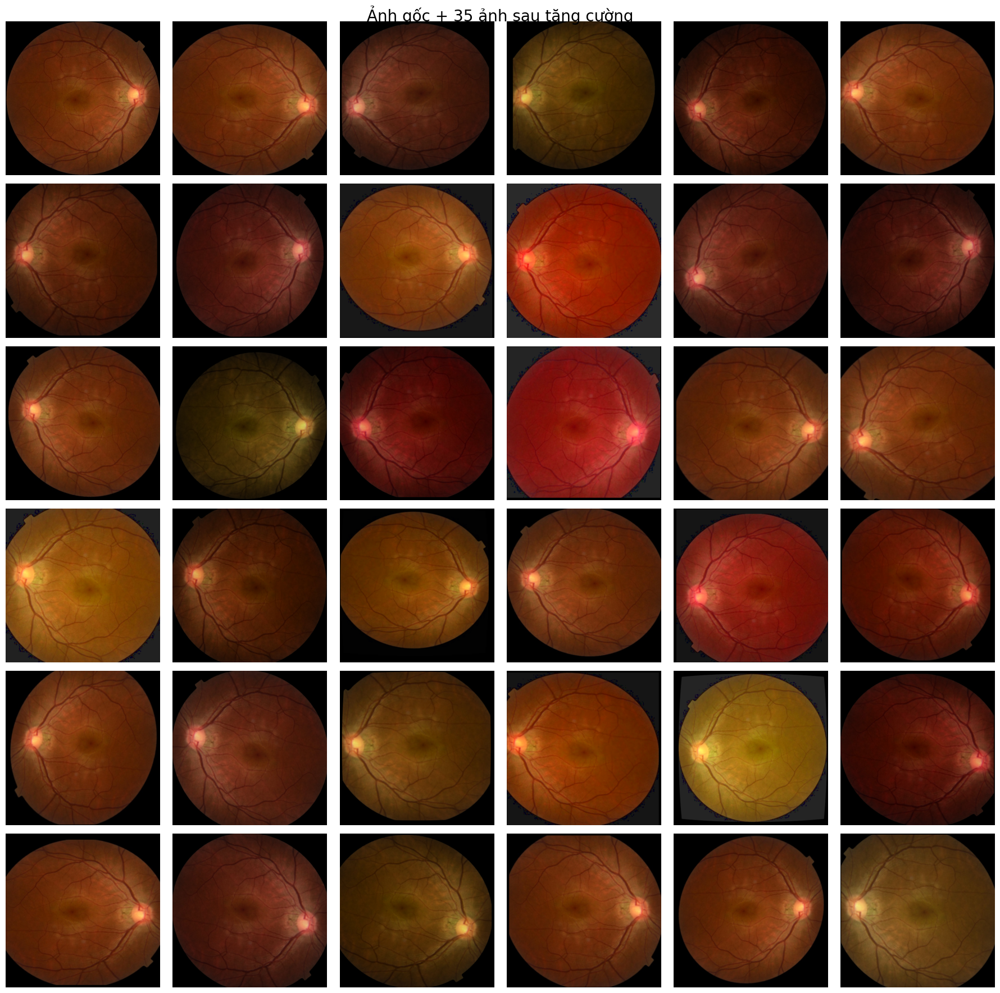

In [9]:
visualize_augmentations("ddr\\train\\0\\007-0007-000.jpg", n=50,is_large=True)

In [6]:
METHOD = "ben_graham"              # "ben_graham" | "clahe_lab" | "clahe_green"
TARGET_SIZE = 512                  # ảnh đầu ra (h = w = 600)
APPLY_CIRCULAR_MASK = True         # che góc đen
DO_CROP_FOV = True                 # crop sát vùng võng mạc trước khi resize
MARGIN_CIRCLE = 4   

In [7]:

def crop_fov(img, thr=10):
    """Crop sát vùng võng mạc: xác định bbox của các pixel > thr (loại biên đen)."""
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    mask = gray > thr
    if not np.any(mask):
        return img
    ys, xs = np.where(mask)
    y0, y1 = int(ys.min()), int(ys.max())
    x0, x1 = int(xs.min()), int(xs.max())
    # phòng hờ biên
    y0 = max(0, y0-2); x0 = max(0, x0-2)
    y1 = min(img.shape[0]-1, y1+2); x1 = min(img.shape[1]-1, x1+2)
    return img[y0:y1+1, x0:x1+1]

def apply_circular_mask(img, margin=MARGIN_CIRCLE):
    """Giữ vùng tròn trung tâm, che góc đen cho ảnh võng mạc."""
    h, w = img.shape[:2]
    r = min(h, w)//2 - margin
    if r <= 0:
        return img
    cx, cy = w//2, h//2
    mask = np.zeros((h, w), np.uint8)
    cv2.circle(mask, (cx, cy), r, 255, -1)
    out = cv2.bitwise_and(img, img, mask=mask)
    return out

def preprocess_ben_graham(bgr, sigma=10):
    """
    Ben Graham preprocessing: giảm non-uniform illumination.
    Công thức phổ biến: out = 4*img - 4*GaussianBlur(img, sigma) + 128
    """
    gb = cv2.GaussianBlur(bgr, (0, 0), sigmaX=sigma, sigmaY=sigma)
    out = cv2.addWeighted(bgr, 4.0, gb, -4.0, 128)
    return np.clip(out, 0, 255).astype(np.uint8)

def preprocess_clahe_lab(bgr, clip=2.0, tile=(8,8)):
    lab = cv2.cvtColor(bgr, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=clip, tileGridSize=tile)
    l2 = clahe.apply(l)
    lab2 = cv2.merge([l2, a, b])
    return cv2.cvtColor(lab2, cv2.COLOR_LAB2BGR)

def preprocess_clahe_green(bgr, clip=2.0, tile=(8,8)):
    g = bgr[:, :, 1]
    clahe = cv2.createCLAHE(clipLimit=clip, tileGridSize=tile)
    g2 = clahe.apply(g)
    # replicate sang 3 kênh để giữ đầu vào 3-channels cho backbone
    return cv2.merge([g2, g2, g2])

def resize_square(img, size=TARGET_SIZE):
    return cv2.resize(img, (size, size), interpolation=cv2.INTER_AREA)

def process_one(img_bgr):
    x = img_bgr.copy()
    # 1) Crop vùng FOV (loại viền đen, cắt gọn)
    if DO_CROP_FOV:
        x = crop_fov(x, thr=10)
    # 2) Resize tạm về vuông để mask tròn đẹp
    x = resize_square(x, TARGET_SIZE)
    # 3) Chọn 1 trong các phương pháp tiền xử lý
    if METHOD == "ben_graham":
        x = preprocess_ben_graham(x, sigma=10)
    elif METHOD == "clahe_lab":
        x = preprocess_clahe_lab(x, clip=2.0, tile=(8,8))
    elif METHOD == "clahe_green":
        x = preprocess_clahe_green(x, clip=2.0, tile=(8,8))

    else:
        # không chọn → giữ nguyên
        pass
    # 4) (tuỳ chọn) Circular mask để che góc
    if APPLY_CIRCULAR_MASK:
        x = apply_circular_mask(x, margin=MARGIN_CIRCLE)
    # 5) Đảm bảo kích thước đầu ra
    x = resize_square(x, TARGET_SIZE)
    return x

In [8]:
# xem truoc 36 anh (da bao gom 1 anh goc + 35 anh)
def visualize_augmentations_after_augmented(image_path, n=35,is_large=False):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Không thể đọc ảnh: {image_path}")
        return
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    if is_large :
        augment = get_augmentations_for_large()   
    else:
        augment=get_augmentations()
    images = [image]  # chứa ảnh gốc
    for _ in range(n):
        augmented = augment(image=image)
        images.append(augmented['image'])

    # Hiển thị ảnh
    rows = 6
    cols = 6
    fig, axs = plt.subplots(rows, cols, figsize=(18, 18))
    fig.suptitle("Ảnh gốc + 35 ảnh sau tăng cường", fontsize=20)

    for i in range(rows * cols):
        ax = axs[i // cols, i % cols]
        if i < len(images):
            img = images[i]
            if isinstance(img, np.ndarray):
                display_img = img
            else:  # nếu là tensor
                display_img = img.permute(1, 2, 0).cpu().numpy()
            display_img = np.clip(display_img, 0, 255).astype(np.uint8)
            preprocess_img=process_one(display_img)
            ax.imshow(preprocess_img)
        ax.axis('off')

    plt.tight_layout()
    plt.show()





<>:1: SyntaxWarning: invalid escape sequence '\D'
<>:1: SyntaxWarning: invalid escape sequence '\D'
C:\Users\tran1\AppData\Local\Temp\ipykernel_12304\2853779677.py:1: SyntaxWarning: invalid escape sequence '\D'
  visualize_augmentations_after_augmented("D:\Diux\hoctap\DoAn\ddr\\train\\0\\007-0007-000.jpg", n=35,is_large=True)
C:\Users\tran1\AppData\Local\Temp\ipykernel_12304\4232032369.py:8: UserWarning: Argument(s) 'height, width' are not valid for transform RandomResizedCrop
  A.RandomResizedCrop(height=IMAGE_SIZE, width=IMAGE_SIZE, scale=(0.9, 0.95), size=(IMAGE_SIZE, IMAGE_SIZE), p=0.7),# cat trong khoang random
C:\Users\tran1\AppData\Local\Temp\ipykernel_12304\4232032369.py:11: UserWarning: Argument(s) 'shift_limit' are not valid for transform OpticalDistortion
  A.OpticalDistortion(distort_limit=0.2, shift_limit=0.2, p=0.5),# lam bien dang


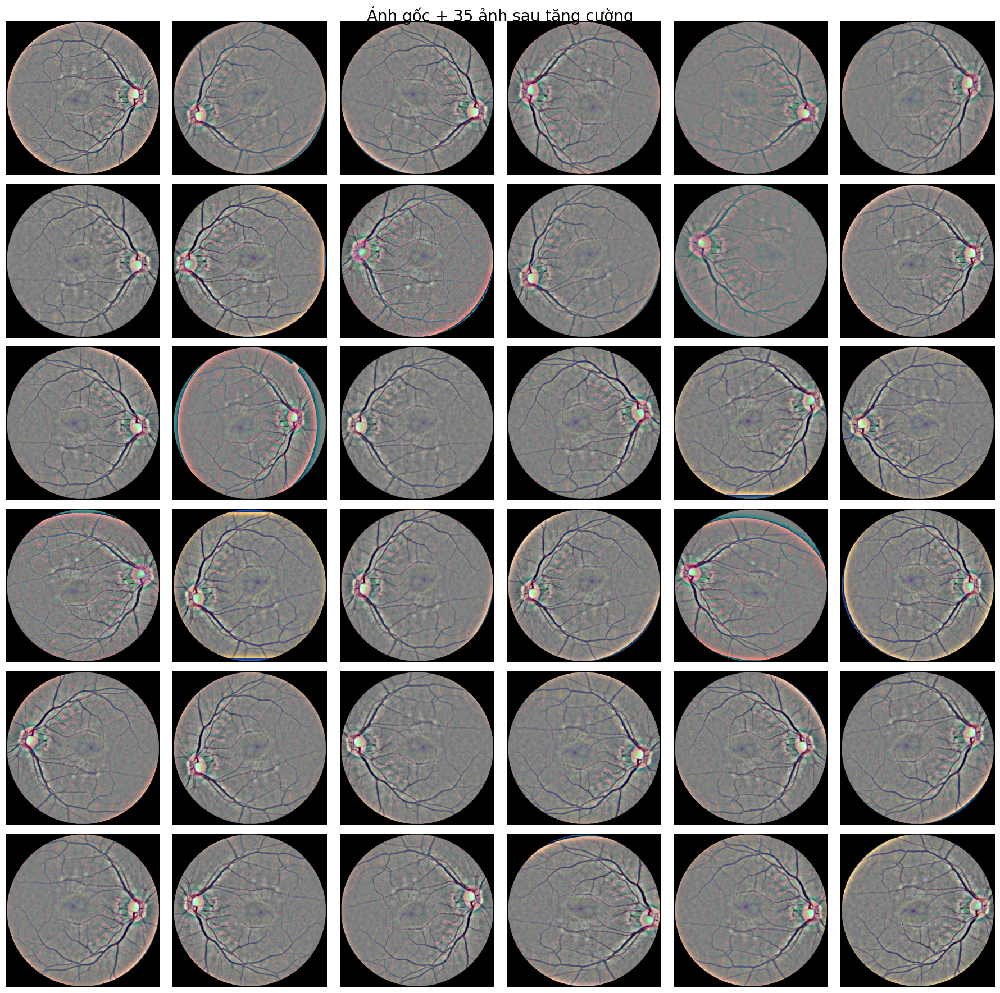

In [14]:
visualize_augmentations_after_augmented("D:\Diux\hoctap\DoAn\ddr\\train\\0\\007-0007-000.jpg", n=35,is_large=True)

In [15]:
def _ensure_unique_path(dst_path: str) -> str:
    """Nếu file đích đã tồn tại, tự thêm _dup1, _dup2,... trước phần mở rộng."""
    if not os.path.exists(dst_path):
        return dst_path
    base, ext = os.path.splitext(dst_path)
    i = 1
    while True:
        cand = f"{base}_dup{i}{ext}"
        if not os.path.exists(cand):
            return cand
        i += 1

def augment_images(n: int, image_dir: str, output_dir: str,
                   keep_original: bool = True,is_large=False,
                   exts=(".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff")):
    """
    Với mỗi ảnh trong image_dir, tạo n ảnh augment + (tuỳ chọn) lưu ảnh gốc vào output_dir.

    Args:
        n: số ảnh augment mỗi ảnh gốc (ví dụ n=3 => mỗi ảnh sinh 3 ảnh mới)
        image_dir: thư mục nguồn, ví dụ "train/0"
        output_dir: thư mục đích, ví dụ "train_augmented/0"
        keep_original: True để copy ảnh gốc sang output_dir
        exts: các phần mở rộng hợp lệ

    Returns:
        (saved_total, saved_aug): tổng số ảnh đã lưu, và số ảnh augment đã lưu
    """
    os.makedirs(output_dir, exist_ok=True)
    if is_large:
        aug = get_augmentations_for_large()
    else:
        aug=get_augmentations()
    # Liệt kê ảnh theo đuôi
    files = []
    for e in exts:
        files += glob.glob(os.path.join(image_dir, f"*{e}"))
        files += glob.glob(os.path.join(image_dir, f"*{e.upper()}"))
    files = sorted(set(files))

    if len(files) == 0:
        print(f"[!] Không tìm thấy ảnh trong: {image_dir}")
        return 0, 0

    saved_total, saved_aug = 0, 0

    for src in tqdm(files, desc=f"Augment x{n} từ {image_dir}"):
        img = cv2.imread(src, cv2.IMREAD_COLOR)  # BGR
        if img is None:
            print(f"[Bỏ qua] Không đọc được ảnh: {src}")
            continue

        fname = os.path.basename(src)
        base, ext = os.path.splitext(fname)

        # 1) Lưu ảnh gốc (nếu muốn)
        if keep_original:
            dst0 = _ensure_unique_path(os.path.join(output_dir, fname))
            img_pre=process_one(img)
            cv2.imwrite(dst0, img_pre)
            saved_total += 1

        # 2) Sinh n ảnh augment
        for i in range(n):
            out = aug(image=img)["image"]  # vẫn BGR
            out_pre=process_one(out)
            dst = _ensure_unique_path(os.path.join(output_dir, f"{base}_aug{i+1:03d}{ext.lower()}"))
            cv2.imwrite(dst, out_pre)
            saved_total += 1
            saved_aug += 1

    print(f"Đã lưu {saved_total} ảnh vào '{output_dir}' (trong đó {saved_aug} là ảnh augment).")
    return saved_total, saved_aug

In [ ]:
#clas 0 4386

In [16]:
# tang cuong label 1 Mild
augment_images(n=9, image_dir="D:\Diux\hoctap\DoAn\ddr\\train\\1", output_dir="D:\Diux\hoctap\DoAn\ddr\\train_preprocess\\1",is_large=True)

<>:2: SyntaxWarning: invalid escape sequence '\D'
<>:2: SyntaxWarning: invalid escape sequence '\D'
<>:2: SyntaxWarning: invalid escape sequence '\D'
<>:2: SyntaxWarning: invalid escape sequence '\D'
C:\Users\tran1\AppData\Local\Temp\ipykernel_12304\1231810223.py:2: SyntaxWarning: invalid escape sequence '\D'
  augment_images(n=9, image_dir="D:\Diux\hoctap\DoAn\ddr\\train\\1", output_dir="D:\Diux\hoctap\DoAn\ddr\\train_preprocess\\1",is_large=True)
C:\Users\tran1\AppData\Local\Temp\ipykernel_12304\1231810223.py:2: SyntaxWarning: invalid escape sequence '\D'
  augment_images(n=9, image_dir="D:\Diux\hoctap\DoAn\ddr\\train\\1", output_dir="D:\Diux\hoctap\DoAn\ddr\\train_preprocess\\1",is_large=True)
C:\Users\tran1\AppData\Local\Temp\ipykernel_12304\4232032369.py:8: UserWarning: Argument(s) 'height, width' are not valid for transform RandomResizedCrop
  A.RandomResizedCrop(height=IMAGE_SIZE, width=IMAGE_SIZE, scale=(0.9, 0.95), size=(IMAGE_SIZE, IMAGE_SIZE), p=0.7),# cat trong khoang rando

Đã lưu 4410 ảnh vào 'D:\Diux\hoctap\DoAn\ddr\train_preprocess\1' (trong đó 3969 là ảnh augment).


(4410, 3969)

In [ ]:
# tang cuong label 2 Moderate

augment_images(n=2, image_dir="D:\Diux\hoctap\DoAn\ddr\\train\\2", output_dir="D:\Diux\hoctap\DoAn\ddr\\train_preprocess\\2",is_large=False)


/tmp/ipykernel_32479/2993466330.py:8: UserWarning: Argument(s) 'height, width' are not valid for transform RandomResizedCrop
  A.RandomResizedCrop(height=IMAGE_SIZE, width=IMAGE_SIZE, scale=(0.9, 0.95), size=(IMAGE_SIZE, IMAGE_SIZE), p=0.7),# cat trong khoang random
/tmp/ipykernel_32479/2993466330.py:11: UserWarning: Argument(s) 'shift_limit' are not valid for transform OpticalDistortion
  A.OpticalDistortion(distort_limit=0.2, shift_limit=0.2, p=0.5),# lam bien dang
Augment x2 từ /home/duc/Documents/DoAn/messidor/train/2: 100%|██████████| 278/278 [00:17<00:00, 16.01it/s]

Đã lưu 834 ảnh vào '/home/duc/Documents/DoAn/messidor/train_preprocess/2' (trong đó 556 là ảnh augment).


(834, 556)

In [17]:
# tang cuong label 3 Severe

augment_images(n=25, image_dir="D:\Diux\hoctap\DoAn\ddr\\train\\3", output_dir="D:\Diux\hoctap\DoAn\ddr\\train_preprocess\\3",is_large=True)


<>:3: SyntaxWarning: invalid escape sequence '\D'
<>:3: SyntaxWarning: invalid escape sequence '\D'
<>:3: SyntaxWarning: invalid escape sequence '\D'
<>:3: SyntaxWarning: invalid escape sequence '\D'
C:\Users\tran1\AppData\Local\Temp\ipykernel_12304\3053538962.py:3: SyntaxWarning: invalid escape sequence '\D'
  augment_images(n=25, image_dir="D:\Diux\hoctap\DoAn\ddr\\train\\3", output_dir="D:\Diux\hoctap\DoAn\ddr\\train_preprocess\\3",is_large=True)
C:\Users\tran1\AppData\Local\Temp\ipykernel_12304\3053538962.py:3: SyntaxWarning: invalid escape sequence '\D'
  augment_images(n=25, image_dir="D:\Diux\hoctap\DoAn\ddr\\train\\3", output_dir="D:\Diux\hoctap\DoAn\ddr\\train_preprocess\\3",is_large=True)
C:\Users\tran1\AppData\Local\Temp\ipykernel_12304\4232032369.py:8: UserWarning: Argument(s) 'height, width' are not valid for transform RandomResizedCrop
  A.RandomResizedCrop(height=IMAGE_SIZE, width=IMAGE_SIZE, scale=(0.9, 0.95), size=(IMAGE_SIZE, IMAGE_SIZE), p=0.7),# cat trong khoang ran

Đã lưu 4290 ảnh vào 'D:\Diux\hoctap\DoAn\ddr\train_preprocess\3' (trong đó 4125 là ảnh augment).


(4290, 4125)

In [18]:
# tang cuong label 4 Proliferative DR


augment_images(6, image_dir="D:\Diux\hoctap\DoAn\ddr\\train\\4", output_dir="D:\Diux\hoctap\DoAn\ddr\\train_preprocess\\4",is_large=True)


<>:4: SyntaxWarning: invalid escape sequence '\D'
<>:4: SyntaxWarning: invalid escape sequence '\D'
<>:4: SyntaxWarning: invalid escape sequence '\D'
<>:4: SyntaxWarning: invalid escape sequence '\D'
C:\Users\tran1\AppData\Local\Temp\ipykernel_12304\2270343807.py:4: SyntaxWarning: invalid escape sequence '\D'
  augment_images(6, image_dir="D:\Diux\hoctap\DoAn\ddr\\train\\4", output_dir="D:\Diux\hoctap\DoAn\ddr\\train_preprocess\\4",is_large=True)
C:\Users\tran1\AppData\Local\Temp\ipykernel_12304\2270343807.py:4: SyntaxWarning: invalid escape sequence '\D'
  augment_images(6, image_dir="D:\Diux\hoctap\DoAn\ddr\\train\\4", output_dir="D:\Diux\hoctap\DoAn\ddr\\train_preprocess\\4",is_large=True)
C:\Users\tran1\AppData\Local\Temp\ipykernel_12304\4232032369.py:8: UserWarning: Argument(s) 'height, width' are not valid for transform RandomResizedCrop
  A.RandomResizedCrop(height=IMAGE_SIZE, width=IMAGE_SIZE, scale=(0.9, 0.95), size=(IMAGE_SIZE, IMAGE_SIZE), p=0.7),# cat trong khoang random
C:

Augment x6 từ D:\Diux\hoctap\DoAn\ddr\train\4: 100%|██████████| 639/639 [03:21<00:00,  3.17it/s]

Đã lưu 4473 ảnh vào 'D:\Diux\hoctap\DoAn\ddr\train_preprocess\4' (trong đó 3834 là ảnh augment).


(4473, 3834)

In [19]:
def copy_class_to_augmented( image_dir, output_dir):
    os.makedirs(output_dir, exist_ok=True)
    files=[f for f in os.listdir(image_dir)]
    for f in tqdm(files,desc="Copying"):
        src= os.path.join(image_dir,f)
        dst=os.path.join(output_dir,f)
        img = cv2.imread(src, cv2.IMREAD_COLOR)
        img_pre=process_one(img)
        cv2.imwrite(dst, img_pre)
        # shutil.copy2(src,dst)
        

In [20]:
copy_class_to_augmented(image_dir="D:\Diux\hoctap\DoAn\ddr\\train\\0",output_dir="D:\Diux\hoctap\DoAn\ddr\\train_preprocess\\0")

<>:1: SyntaxWarning: invalid escape sequence '\D'
<>:1: SyntaxWarning: invalid escape sequence '\D'
<>:1: SyntaxWarning: invalid escape sequence '\D'
<>:1: SyntaxWarning: invalid escape sequence '\D'
C:\Users\tran1\AppData\Local\Temp\ipykernel_12304\644461309.py:1: SyntaxWarning: invalid escape sequence '\D'
  copy_class_to_augmented(image_dir="D:\Diux\hoctap\DoAn\ddr\\train\\0",output_dir="D:\Diux\hoctap\DoAn\ddr\\train_preprocess\\0")
C:\Users\tran1\AppData\Local\Temp\ipykernel_12304\644461309.py:1: SyntaxWarning: invalid escape sequence '\D'
  copy_class_to_augmented(image_dir="D:\Diux\hoctap\DoAn\ddr\\train\\0",output_dir="D:\Diux\hoctap\DoAn\ddr\\train_preprocess\\0")
Copying: 100%|██████████| 4386/4386 [03:46<00:00, 19.40it/s]


In [21]:
copy_class_to_augmented(image_dir="D:\Diux\hoctap\DoAn\ddr\\train\\2",output_dir="D:\Diux\hoctap\DoAn\ddr\\train_preprocess\\2")


<>:1: SyntaxWarning: invalid escape sequence '\D'
<>:1: SyntaxWarning: invalid escape sequence '\D'
<>:1: SyntaxWarning: invalid escape sequence '\D'
<>:1: SyntaxWarning: invalid escape sequence '\D'
C:\Users\tran1\AppData\Local\Temp\ipykernel_12304\2826142951.py:1: SyntaxWarning: invalid escape sequence '\D'
  copy_class_to_augmented(image_dir="D:\Diux\hoctap\DoAn\ddr\\train\\2",output_dir="D:\Diux\hoctap\DoAn\ddr\\train_preprocess\\2")
C:\Users\tran1\AppData\Local\Temp\ipykernel_12304\2826142951.py:1: SyntaxWarning: invalid escape sequence '\D'
  copy_class_to_augmented(image_dir="D:\Diux\hoctap\DoAn\ddr\\train\\2",output_dir="D:\Diux\hoctap\DoAn\ddr\\train_preprocess\\2")
Copying: 100%|██████████| 3134/3134 [02:59<00:00, 17.49it/s]


In [22]:
num_classes = 5  # hoặc 3 nếu bạn chỉ muốn class 0–2
for i in range(num_classes):
    image_dir  = f"D:\Diux\hoctap\DoAn\ddr\\val\\{i}"
    output_dir = f"D:\Diux\hoctap\DoAn\ddr\\val_preprocess\\{i}"
    copy_class_to_augmented(image_dir, output_dir)

<>:3: SyntaxWarning: invalid escape sequence '\D'
<>:4: SyntaxWarning: invalid escape sequence '\D'
<>:3: SyntaxWarning: invalid escape sequence '\D'
<>:4: SyntaxWarning: invalid escape sequence '\D'
C:\Users\tran1\AppData\Local\Temp\ipykernel_12304\3021228982.py:3: SyntaxWarning: invalid escape sequence '\D'
  image_dir  = f"D:\Diux\hoctap\DoAn\ddr\\val\\{i}"
C:\Users\tran1\AppData\Local\Temp\ipykernel_12304\3021228982.py:4: SyntaxWarning: invalid escape sequence '\D'
  output_dir = f"D:\Diux\hoctap\DoAn\ddr\\val_preprocess\\{i}"
Copying: 100%|██████████| 183/183 [00:13<00:00, 13.87it/s]


In [23]:
num_classes = 5  # hoặc 3 nếu bạn chỉ muốn class 0–2
for i in range(num_classes):
    image_dir  = f"D:\Diux\hoctap\DoAn\ddr\\test\\{i}"
    output_dir = f"D:\Diux\hoctap\DoAn\ddr\\test_preprocess\\{i}"
    copy_class_to_augmented(image_dir, output_dir)

<>:3: SyntaxWarning: invalid escape sequence '\D'
<>:4: SyntaxWarning: invalid escape sequence '\D'
<>:3: SyntaxWarning: invalid escape sequence '\D'
<>:4: SyntaxWarning: invalid escape sequence '\D'
C:\Users\tran1\AppData\Local\Temp\ipykernel_12304\4261511334.py:3: SyntaxWarning: invalid escape sequence '\D'
  image_dir  = f"D:\Diux\hoctap\DoAn\ddr\\test\\{i}"
C:\Users\tran1\AppData\Local\Temp\ipykernel_12304\4261511334.py:4: SyntaxWarning: invalid escape sequence '\D'
  output_dir = f"D:\Diux\hoctap\DoAn\ddr\\test_preprocess\\{i}"
Copying: 100%|██████████| 91/91 [00:07<00:00, 12.29it/s]


In [9]:
def show_one_and_clone_not_clahe(path):
    img = cv2.imread(path, cv2.IMREAD_COLOR)

    proc = process_one(img)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    print(proc[350][350])
    ax1.imshow(img)
    ax1.set_title('goc')

    ax2.imshow(proc)
    ax2.set_title('ben_graham')

    plt.show()

<>:1: SyntaxWarning: invalid escape sequence '\D'
<>:1: SyntaxWarning: invalid escape sequence '\D'
C:\Users\tran1\AppData\Local\Temp\ipykernel_16544\2999196943.py:1: SyntaxWarning: invalid escape sequence '\D'
  show_one_and_clone_not_clahe("D:\Diux\hoctap\DoAn\ddr\\train\\3\\007-1723-000.jpg")


[132 144 140]


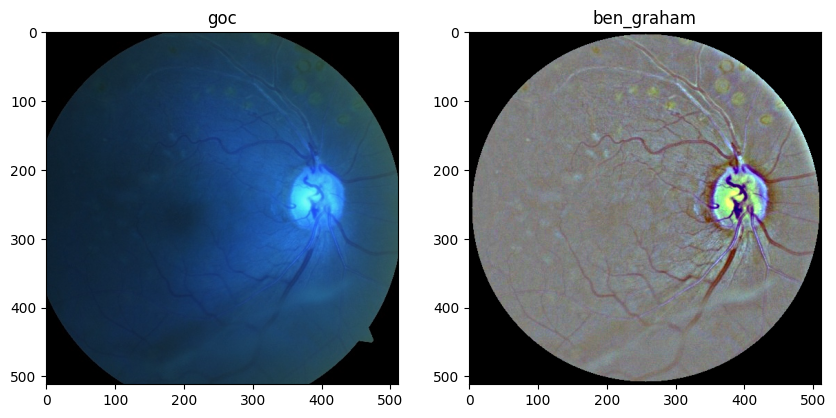

In [10]:
show_one_and_clone_not_clahe("D:\Diux\hoctap\DoAn\ddr\\train\\3\\007-1723-000.jpg")

In [3]:
!ipynb-py-convert pre_preprocess_augment_directory.ipynb pre_preprocess_augment_directory.py
